In [1]:
import os
os.environ['CUDA_VISIBLE_DEVICES']='0'

os.environ['PATH']="/bin:/usr/bin:/usr/local/cuda-12.3/bin:/opt/hpcx/ompi/bin:/bin/screen/:/home/m_bobrin/anaconda3/envs/icvf/bin/:/anaconda3/envs/icvf/"
os.environ['LD_LIBRARY_PATH']="/usr/local/cuda-12.3/lib64:/usr/local/cuda-12.3/extras/CUPTI/lib64"

In [11]:
# import sys
# sys.path.append('..')

import jax
import pandas as pd
import jax.numpy as jnp
import optax

import os
import warnings
warnings.filterwarnings('ignore')

import dataclasses
from IPython.display import clear_output, display
from typing import Iterator, Literal, NamedTuple, Optional, Tuple, Callable, Dict, Sequence, Union

import matplotlib.pyplot as plt

from ott import datasets
from ott.geometry import costs
from ott.neural import models
from ott.neural.solvers import neuraldual
from ott.tools import sinkhorn_divergence
from ott.geometry import pointcloud
from ott.solvers.linear import sinkhorn
from ott.problems.linear import linear_problem
from ott.datasets import Dataset
 
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Expectile Regularization

In [3]:
# from flax import linen as nn
# from typing import Any, Callable, Dict, Optional, Sequence, Tuple, Union

# class PotentialNN(neuraldual.BaseW2NeuralDual):
#   dim_hidden: Sequence[int]
#   is_potential: bool = True
#   act_fn: Callable[[jnp.ndarray], jnp.ndarray] = nn.leaky_relu

#   @nn.compact
#   def __call__(self, x: jnp.ndarray) -> jnp.ndarray:  # noqa: D102
#     squeeze = x.ndim == 1
#     if squeeze:
#       x = jnp.expand_dims(x, 0)
#     assert x.ndim == 2, x.ndim
#     n_input = x.shape[-1]

#     z = x
#     for n_hidden in self.dim_hidden:
#       Wx = nn.Dense(n_hidden, use_bias=True)
#       z = self.act_fn(Wx(z))

#     if self.is_potential:
#       Wx = nn.Dense(1, use_bias=True)
#       z = Wx(z).squeeze(-1)

#       # quad_term = 0.5 * jax.vmap(jnp.dot)(x, x)
#       # z += quad_term
#     else:
#       Wx = nn.Dense(n_input, use_bias=True)
#       z = x + Wx(z)

#     return z.squeeze(0) if squeeze else z


## Expectile regularization on synstethic 2D datasets

We show how ENOT finds optimal map between two measures constructed from {cite}`makkuva:20`. Here, we utilize `~ott.datasets.create_gaussian_mixture_samplers` in order to get samples from source measure `square_five` and target measure `square_four`. Also, in this notebook we use `plotly` library for plotting, which can be installed via `pip install plotly`

In [3]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

num_samples_visualize = 512
num_train_iters = 50_001
(
    train_dataloaders,
    valid_dataloaders,
    input_dim,
) = datasets.create_gaussian_mixture_samplers(
    name_source="square_five",
    name_target="square_four",
    valid_batch_size=num_samples_visualize,
    train_batch_size=1024
)
       
eval_data_source = next(valid_dataloaders.source_iter)
eval_data_target = next(valid_dataloaders.target_iter)

In [4]:
def vizualize_measures(eval_data_source, eval_data_target):
    fig = make_subplots(rows=1, cols=2)
    fig.add_trace(
        go.Scatter(x=eval_data_source[:, 0], y=eval_data_source[:, 1], mode='markers', marker_color='LightSkyBlue', name='Source'), row=1, col=1
    )
    fig.add_trace(
        go.Scatter(x=eval_data_target[:, 0], y=eval_data_target[:, 1], mode='markers', marker_color='red', name='Target'), row=1, col=2
    )
    fig.update_layout(
        title_text="Examples of two measures", title_font_size=25, title_x=0.5
    )
    fig.update_traces(
        marker=dict(size=8, line=dict(width=0.8, color='black'))
    )
    fig.update_xaxes(visible=False)
    fig.update_yaxes(visible=False)
    fig.show()

vizualize_measures(eval_data_source, eval_data_target)

In [5]:
def training_callback(step, learned_potentials):
    if step % 2500 == 0:
        clear_output()
        print(f"Training iteration: {step}/{num_train_iters}")

        neural_dual_dist = learned_potentials.distance(eval_data_source, eval_data_target)
        print(
            f"Neural dual distance between source and target data: {neural_dual_dist:.2f}"
        )

        # fig, ax = learned_potentials.plot_ot_map(
        #     eval_data_source,
        #     eval_data_target,
        #     forward=True,
        # )
        # display(fig)
        # plt.close(fig)

        fig, ax = learned_potentials.plot_ot_map(
            eval_data_source,
            eval_data_target,
            forward=False,
        )
        display(fig)
        plt.close(fig)

        # fig, ax = learned_potentials.plot_potential()
        # display(fig)
        # plt.close(fig)


Here, by setting `is_bidirectional` flag in `ExpectileNeuralDual` class to `True`, which computes OT in alternating fashion. Main hyperparameters to look at are `expectile` and `expectile_loss_coef`, denoted in paper as $\tau$ and $\lambda$ respectively.

Training iteration: 50000/50001
Neural dual distance between source and target data: 21.26


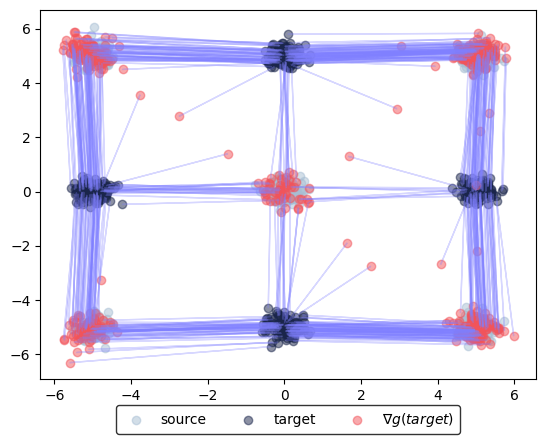

In [6]:
from ott.neural.solvers.expectile_neural_dual import ExpectileNeuralDual
from ott.neural.models import MLP

neural_f = MLP(dim_hidden=[128, 128, 128, 128], act_fn=jax.nn.gelu)
neural_g = MLP(dim_hidden=[128, 128, 128, 128], act_fn=jax.nn.gelu)

lr_schedule_f = optax.cosine_decay_schedule(
    init_value=3e-4, decay_steps=num_train_iters, alpha=1e-2
)

lr_schedule_g = optax.cosine_decay_schedule(
    init_value=3e-4, decay_steps=num_train_iters, alpha=1e-2
)
optimizer_f = optax.adam(learning_rate=lr_schedule_f, b1=0.9, b2=0.999)
optimizer_g = optax.adam(learning_rate=lr_schedule_g, b1=0.9, b2=0.999)

neural_dual_solver = ExpectileNeuralDual(
    input_dim,
    neural_f,
    neural_g,
    optimizer_f,
    optimizer_g,
    cost_fn=costs.SqEuclidean(),
    num_train_iters=num_train_iters,
    expectile=0.99,
    expectile_loss_coef=1,
    rng=jax.random.PRNGKey(3),
    is_bidirectional=True
)
learned_potentials = neural_dual_solver(
    *train_dataloaders,
    *valid_dataloaders,
    callback=training_callback,
)

ValueError: cannot reshape array of size 6250000 into shape (50,50)

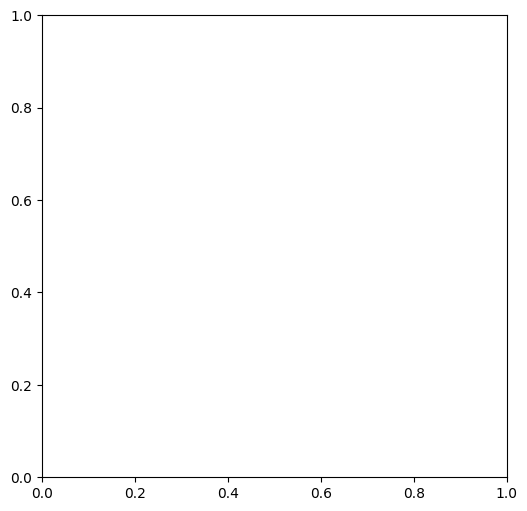

In [16]:
learned_potentials.plot_potential(forward=True)

Below we show how expectile regularization behaves on more challenging tasks. For such case we implement `MAFMoon` and `Ring` datasets.

In [31]:
import sklearn

@dataclasses.dataclass
class MAFMoonSampler:
    def __init__(self, size):
        self.size = size
        
    def __iter__(self):
        rng = jax.random.PRNGKey(0)
        while True:
            rng, sample_key = jax.random.split(rng, 2)
            yield self._sample(sample_key, self.size)
            
    def _sample(self, key, batch_size):
        x = jax.random.normal(key, shape=[batch_size, 2])
        x = x.at[:,0].add(x[:,1] ** 2)
        x = x.at[:,0].mul(0.5)
        x = x.at[:,0].add(-2)
        return x
    
@dataclasses.dataclass
class RingSampler:
    def __init__(self, size):
        self.size = size

    def __iter__(self):
        rng = jax.random.PRNGKey(0)
        while True:
            rng, sample_key = jax.random.split(rng, 2)
            yield self._sample(sample_key, self.size)
            
    def _sample(self, key, batch_size):
        n_samples4 = n_samples3 = n_samples2 = batch_size // 4
        n_samples1 = batch_size - n_samples4 - n_samples3 - n_samples2

        linspace4 = jnp.linspace(0, 2 * jnp.pi, n_samples4, endpoint=False)
        linspace3 = jnp.linspace(0, 2 * jnp.pi, n_samples3, endpoint=False)
        linspace2 = jnp.linspace(0, 2 * jnp.pi, n_samples2, endpoint=False)
        linspace1 = jnp.linspace(0, 2 * jnp.pi, n_samples1, endpoint=False)

        circ4_x = jnp.cos(linspace4)
        circ4_y = jnp.sin(linspace4)
        circ3_x = jnp.cos(linspace4) * 0.75
        circ3_y = jnp.sin(linspace3) * 0.75
        circ2_x = jnp.cos(linspace2) * 0.5
        circ2_y = jnp.sin(linspace2) * 0.5
        circ1_x = jnp.cos(linspace1) * 0.25
        circ1_y = jnp.sin(linspace1) * 0.25

        X = jnp.vstack([
            jnp.hstack([circ4_x, circ3_x, circ2_x, circ1_x]),
            jnp.hstack([circ4_y, circ3_y, circ2_y, circ1_y])
        ]).T * 3.0
        X = sklearn.utils.shuffle(X)

        # Add noise
        X = X + jax.random.normal(key, shape=X.shape)*0.08

        return X.astype("float32")

In [33]:
train_dataloaders = Dataset(
    source_iter=iter(MAFMoonSampler(size=1024)),
    target_iter=iter(RingSampler(size=1024))
)
valid_loaders = train_dataloaders

moon_samples = next(valid_loaders.source_iter)
ring_samples = next(valid_loaders.target_iter)

vizualize_measures(moon_samples, ring_samples)

Training iteration: 70000/70001
Neural dual distance between source and target data: 3.31


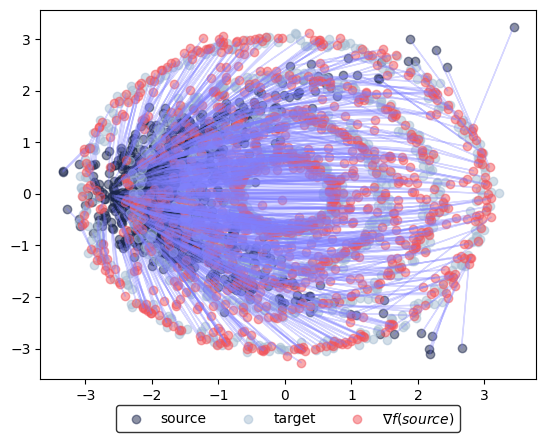

In [34]:
def training_callback(step, learned_potentials):
    if step % 2500 == 0:
        clear_output()
        print(f"Training iteration: {step}/{num_train_iters}")

        neural_dual_dist = learned_potentials.distance(moon_samples, ring_samples)
        print(
            f"Neural dual distance between source and target data: {neural_dual_dist:.2f}"
        )

        fig, ax = learned_potentials.plot_ot_map(
            moon_samples,
            ring_samples,
            forward=True,
        )
        display(fig)
        plt.close(fig)

        # fig, ax = learned_potentials.plot_potential()
        # display(fig)
        # plt.close(fig)
        
neural_f = MLP(dim_hidden=[128, 128, 128, 128, 1], act_fn=jax.nn.gelu)
neural_g = MLP(dim_hidden=[128, 128, 128, 128, 1], act_fn=jax.nn.gelu)

num_train_iters=70_001
lr_schedule_f = optax.cosine_decay_schedule(
    init_value=3e-4, decay_steps=num_train_iters, alpha=1e-2
)

lr_schedule_g = optax.cosine_decay_schedule(
    init_value=3e-4, decay_steps=num_train_iters, alpha=1e-2
)
optimizer_f = optax.adam(learning_rate=lr_schedule_f, b1=0.9, b2=0.999)
optimizer_g = optax.adam(learning_rate=lr_schedule_g, b1=0.9, b2=0.999)

neural_dual_solver = ExpectileNeuralDual(
    input_dim,
    neural_f,
    neural_g,
    optimizer_f,
    optimizer_g,
    cost_fn=costs.SqEuclidean(),
    num_train_iters=num_train_iters,
    expectile=0.99,
    expectile_loss_coef=0.3,
    rng=jax.random.PRNGKey(4),
    is_bidirectional=True
)
learned_potentials = neural_dual_solver(
    *train_dataloaders,
    *valid_dataloaders,
    callback=training_callback,
)

In [35]:
vizualize_measures(moon_samples, learned_potentials.transport(moon_samples))

## Geodesics on Sphere

In [4]:
from flax import linen as nn
from typing import Any, Callable, Dict, Optional, Sequence, Tuple, Union

class SphericalPotentialNN(neuraldual.BaseW2NeuralDual):
  dim_hidden: Sequence[int]
  is_potential: bool = True
  act_fn: Callable[[jnp.ndarray], jnp.ndarray] = nn.leaky_relu

  @nn.compact
  def __call__(self, x: jnp.ndarray) -> jnp.ndarray:
    squeeze = x.ndim == 1
    if squeeze:
      x = jnp.expand_dims(x, 0)
    assert x.ndim == 2, x.ndim
    n_input = x.shape[-1]

    z = x
    for n_hidden in self.dim_hidden:
      Wx = nn.Dense(n_hidden, use_bias=True)
      z = self.act_fn(Wx(z))

    if self.is_potential:
      Wx = nn.Dense(1, use_bias=True) # output is 3 dim
      z = Wx(z).squeeze()

      # quad_term = 0.5 * jax.vmap(jnp.dot)(x, x)
      # z += quad_term
    else:
      Wx = nn.Dense(n_input, use_bias=True)
      z = Wx(z) #x + Wx(z)
      z = z / (jnp.sqrt(jnp.sum(z ** 2, axis=-1, keepdims=True) + 1e-5))

    return z.squeeze(0) if squeeze else z


In [5]:
test_nn = SphericalPotentialNN(dim_hidden=[32, 32, 32], is_potential=False)
test_nn_state = test_nn.create_train_state(optimizer=optax.adam(learning_rate=0.0001, b1=0.5, b2=0.9, eps=1e-8),
                                           input=(1, 3), rng=jax.random.PRNGKey(42))
test_nn_state.apply_fn({'params': test_nn_state.params}, jnp.array([[1., 5., 2.],
                                                                    [2., 3.4, 1.2]]))

Array([[-0.7689914 ,  0.62684304, -0.12530473],
       [-0.5995331 ,  0.7763654 , -0.19439805]], dtype=float32)

In [36]:
import numpy as np

def spherical_to_cartesian(polar_angle, azimuth_angle): # theta, phi
    """
    param: polar_angle - angle from z-axis toward xy plane [0, pi]
    param: azimuth_angle - angle from x-axis to y-axis [-pi, pi]
    """
    sinx = jnp.sin(azimuth_angle)
    siny = jnp.sin(polar_angle)
    cosx = jnp.cos(azimuth_angle)
    cosy = jnp.cos(polar_angle)
    return jnp.stack((sinx * cosy, sinx * siny, cosx), axis=-1)

def raw_sphere_data(num_points: int, rng):
    z = jax.random.uniform(key=rng, shape=(num_points, )) * 2 - 1 # from -1 to 1
    phi = jax.random.uniform(key=jax.random.PRNGKey(1000), shape=(num_points, )) * 2 * jnp.pi - jnp.pi # from -pi to pi
    x = jnp.cos(phi) * jnp.sqrt(1 - z ** 2)
    y = jnp.sin(phi) * jnp.sqrt(1 - z ** 2)
    return jnp.stack((x, y, z), axis=1)

def banded_sphere_data(num_points, z_min, z_max, rng):
  raw_data = raw_sphere_data(num_points, rng)
  classes = ((raw_data[:,2] > z_min) & (raw_data[:,2] < z_max))[:, None, ...]
  return jnp.concatenate((raw_data, classes), axis=1)

def antipodal_measures(num_points, z_min, z_max, rng):
  raw_data = raw_sphere_data(num_points, rng)
  classes = np.full(shape=raw_data.shape[0], fill_value=-1)
  source_measure = np.nonzero((raw_data[:, 2] > z_max) & ((raw_data[:, 0] ** 2 + raw_data[:, 1] ** 2) <= 1) & ((raw_data[:, 0] ** 2 + raw_data[:, 1] ** 2) >= 0.1))
  target_measure = np.nonzero((raw_data[:, 2] < z_min) & ((raw_data[:, 0] ** 2 + raw_data[:, 1] ** 2) <= 1) & ((raw_data[:, 0] ** 2 + raw_data[:, 1] ** 2) >= 0.4))
  classes[source_measure] = 1
  classes[target_measure] = 0
  return np.concatenate((raw_data, classes[:, None]), axis=-1)

def balance_classes(data):
  A, B = split_classes(data)
  if A.shape[0] > B.shape[0]:
    A = A[:B.shape[0]]
  else:
    B = B[:A.shape[0]]
  return jnp.concatenate((A,B), axis=0)

def trivial_sphere_data(num_points, rng):
  raw_data = raw_sphere_data(num_points, rng)
  classes = (raw_data[:,2] > 0)[..., None]
  return jnp.concatenate((raw_data, classes), axis=-1)

def ball_seam_data(num_points, rng):
  raw_data = raw_sphere_data(num_points, rng)
  cond = raw_data[:,0]**2 - raw_data[:,2]**2 + raw_data[:,1]**3 / 3
  classes = (cond > 0)[..., None]
  return jnp.concatenate((raw_data, classes), axis=1)

def make_sphere_mesh(x, y, z, radius, resolution=10):
  center = jnp.array([x, y, z])[None, None, :]
  p = jnp.linspace(0, 2 * jnp.pi, resolution)
  a = jnp.linspace(0, jnp.pi, resolution)
  P, A = jnp.meshgrid(p, a, indexing='ij')
  return spherical_to_cartesian(P,A) * radius + center

def split_classes(data):
  A_index = jnp.nonzero(data[:,-1] > 0)
  B_index = jnp.nonzero(data[:,-1] == 0)
  return data[A_index], data[B_index]

def scatter_class(data, *args, **kwargs):
  return go.Scatter3d(x=data[:,0], y=data[:,1], z=data[:,2], *args, **kwargs)


In [71]:
import plotly.graph_objects as go

data = antipodal_measures(10_000, z_min=-0.7, z_max=0.75, rng=jax.random.PRNGKey(0))
#data = balance_classes(data)
data = jax.random.permutation(key=jax.random.PRNGKey(32), x=data)

train_portion = 0.8
sz = int(len(data) * train_portion)

train_data = data[:sz]
test_data = data[sz:]

sphere = make_sphere_mesh(0,0,0, 1, resolution=50)
source, target = split_classes(train_data)

fig = go.Figure()

num_points_to_viz = 200

fig.add_trace(
    scatter_class(
        source[:num_points_to_viz,:-1],
        showlegend=True,
        mode = 'markers',
        marker_color = 'blue',
        marker=dict(size=8,
                    color='blue',
                    line=dict(
                        color='MediumPurple',
                        width=2
                    ),
        ),
        name=r'$\text{Source} \: \mu$'
    )
)
fig.add_trace(
    scatter_class(
        target[:num_points_to_viz,:-1],
        showlegend=True,
        mode = 'markers',
        marker_color = 'red',
        marker=dict(size=4,
                    color='red',
                    line=dict(
                        width=2
                    )
        ),
        marker_symbol='x',
        marker_line_width=2,
        marker_line_color="midnightblue",
        name=r'$\text{Target} \: \nu$'
    )
)
fig.add_trace(
    go.Surface(
        x=sphere[...,0],
        y=sphere[...,1],
        z=sphere[...,2],
        opacity=0.5,
        surfacecolor=sphere[...,0]*0+0.1,
        showscale=False,
        lighting_diffuse=0.3,
        colorscale='Greys')
)

bound = 2
scene = dict(
    xaxis = dict(nticks=4, range=[-bound, bound]),
    yaxis = dict(nticks=4, range=[-bound, bound]),
    zaxis = dict(nticks=4, range=[-bound, bound]),
    aspectmode = 'cube'
)

fig.update_layout(
    scene_camera=dict(eye=dict(x=0.45, y=0.45, z=0.4)),
    scene=scene,
    height=700,
    width=1000,
    showlegend=True,
    xaxis=dict(visible=False),
    yaxis=dict(visible=False),
    legend=dict(font = dict(size = 25, color = "black")),
)
fig.write_image("sphere_init.svg")
fig.show()

In [72]:
import numpy as np

class SphericalSamplerSourceMeasure:
    def __init__(self, source_measure, batch_size):
        self.batch_size = batch_size
        self.source_measure = source_measure
    
    def __iter__(self):
        return self.sample_source()
    
    def sample_source(self):
        rng = jax.random.PRNGKey(42)
        while True:
            rng, sample_key = jax.random.split(rng, 2)
            yield jax.random.choice(key=sample_key, a=self.source_measure, shape=(self.batch_size, ))

class SphericalSamplerTargetMeasure:
    def __init__(self, target_measure, batch_size):
        self.batch_size = batch_size
        self.target_measure = target_measure
    
    def __iter__(self):
        return self.sample_target()
    
    def sample_target(self):
        rng = jax.random.PRNGKey(0)
        while True:
            rng, sample_key = jax.random.split(rng, 2)
            yield jax.random.choice(key=sample_key, a=self.target_measure, shape=(self.batch_size, ))

valid_source, valid_target = split_classes(test_data)
batch_size = 128

train_dataset = Dataset(
    source_iter=iter(SphericalSamplerSourceMeasure(source_measure=target[:, :-1], batch_size=batch_size)),
    target_iter=iter(SphericalSamplerTargetMeasure(target_measure=source[:, :-1], batch_size=batch_size))
)

valid_dataset = Dataset(
    source_iter=iter(SphericalSamplerSourceMeasure(source_measure=valid_target[:, :-1], batch_size=256)),
    target_iter=iter(SphericalSamplerTargetMeasure(target_measure=valid_source[:, :-1], batch_size=256))
)

In [78]:
from src.anycost_neural import ENOT
from ott.geometry import costs

neural_f = SphericalPotentialNN(dim_hidden=[32, 64, 32], is_potential=True)
neural_g = SphericalPotentialNN(dim_hidden=[32, 64, 32], is_potential=False)

num_train_iters = 1500

lr_schedule_f = optax.cosine_decay_schedule(
    init_value=3e-4, decay_steps=num_train_iters, alpha=1e-3
)

lr_schedule_g = optax.cosine_decay_schedule(
    init_value=3e-4, decay_steps=num_train_iters, alpha=1e-3
)
optimizer_f = optax.adam(learning_rate=lr_schedule_f, b1=0.9, b2=0.99)
optimizer_g = optax.adam(learning_rate=lr_schedule_g, b1=0.9, b2=0.99)

neural_dual_solver = ENOT(
    3,
    neural_f,
    neural_g,
    optimizer_f,
    optimizer_g,
    num_train_iters=num_train_iters,
    expectile=0.9,
    expectile_loss_coef=1,
    rng=jax.random.PRNGKey(1337),
    is_symmetric=False,
    use_dot_product=False,
    cost_fn=costs.Arccos(n=0)
)
learned_potentials = neural_dual_solver(
    *train_dataset,
    *valid_dataset,
)


  0%|          | 0/1500 [00:00<?, ?it/s]

u_diff 4.23193e-06


In [79]:
def slerp(p1, p2, t):
    omega = np.arccos((p1 * p2).sum(-1))
    sin_omega = np.sin(omega)    
    t = t[:, np.newaxis]
    return ( np.sin( (1-t)*omega )*p1 + np.sin( t*omega )*p2 )/sin_omega

In [81]:
valid_plot_source = next(valid_dataset.target_iter)
predicted_target = learned_potentials.transport(valid_plot_source)

fig = go.Figure()
fig.add_trace(
    scatter_class(
        valid_plot_source,
        showlegend=False,
        mode = 'markers',
        marker_color = 'blue',
        marker=dict(size=6,
                    color='blue',
                    line=dict(
                        color='MediumPurple',
                        width=2
                    ),
        ),
    )
)
fig.add_trace(
    scatter_class(
        predicted_target,
        showlegend=False,
        mode = 'markers',
        marker_color = 'red',
        marker=dict(size=4,
                    color='red',
                    line=dict(
                        color='MediumPurple',
                        width=2
                    )
        ),
        marker_symbol='x',
        marker_line_width=2,
        marker_line_color="midnightblue"
    )
)
for i in range(valid_plot_source.shape[0]):
    fig.add_trace(
        scatter_class(
            slerp(valid_plot_source[i, :], predicted_target[i, :], t=np.linspace(0, 1, 50)), #layer_lerp(valid_plot_source, predicted_target, num_steps=50)[:, 0, :],
            showlegend=False,
            mode = 'lines',
            marker_color = 'red',
            marker=dict(size=4,
                        color='red',
                        line=dict(
                            color='MediumPurple',
                            width=2
                        )
            ),
        )
    )
fig.add_trace(
    scatter_class(
        next(valid_dataset.source_iter),
        showlegend=False,
        mode = 'markers',
        marker_color = 'orange',
        marker=dict(size=4,
                    color='orange',
                    line=dict(
                        color='MediumPurple',
                        width=2
                    )
        ),
        marker_symbol='x',
        marker_line_width=2,
        marker_line_color="midnightblue"
    )
)
fig.add_trace(
    go.Surface(
        x=sphere[...,0],
        y=sphere[...,1],
        z=sphere[...,2],
        opacity=0.5,
        surfacecolor=sphere[...,0]*0+0.1,
        showscale=False,
        lighting_diffuse=0.3,
        colorscale='Greys')
)

bound = 2
scene = dict(
    xaxis = dict(nticks=4, range=[-bound, bound]),
    yaxis = dict(nticks=4, range=[-bound, bound]),
    zaxis = dict(nticks=4, range=[-bound, bound]),
    aspectmode = 'cube'
)

fig.update_layout(
    scene_camera=dict(eye=dict(x=0.45, y=0.45, z=0.4)),
    scene=scene,
    height=1000,
    width=1000,
    showlegend=True,
)
fig.write_image("sphere_enot.svg")
fig.show()

In [95]:
from ott.neural import losses, models
from ott.neural.solvers import map_estimator

def fit_map(
    cost_fn,
    relative_epsilon_fitting=1e-1,
    relative_epsilon_regularizer=1e-2,
    regularizer_strength=1.0,
    num_train_iters=300,
):
    dim_data = 3
    # define the neural map
    model = SphericalPotentialNN(
        dim_hidden=[32, 64, 32], is_potential=False, act_fn=nn.leaky_relu
    )

    # define the optimizer to learn the neural map
    lr = 1e-3
    optimizer = optax.adam(learning_rate=lr)

    # Compute an order of magnitude for epsilon fitting
    y = next(train_dataset.target_iter)
    epsilon_fitting_scale = pointcloud.PointCloud(y).mean_cost_matrix
    epsilon_fitting = relative_epsilon_fitting * epsilon_fitting_scale
    print("Selected `epsilon_fitting`:", epsilon_fitting)

    @jax.jit
    def fitting_loss(x, y):
        out = sinkhorn_divergence.sinkhorn_divergence(
            pointcloud.PointCloud, x, y, epsilon=epsilon_fitting, static_b=True
        )
        return out.divergence, out.n_iters

    if cost_fn is None:
        regularizer = None
    else:
        # Compute an order of magnitude for epsilon regularizer
        x = next(train_dataset.source_iter)
        epsilon_regularizer_scale = pointcloud.PointCloud(x, y).mean_cost_matrix
        epsilon_regularizer = (
            relative_epsilon_regularizer * epsilon_regularizer_scale
        )
        print("Selected `epsilon_regularizer`:", epsilon_regularizer)

        def regularizer(x, y):
            gap, out = losses.monge_gap_from_samples(
                x,
                y,
                cost_fn=cost_fn,
                epsilon=epsilon_regularizer,
                return_output=True,
            )
            return gap, out.n_iters

    # define solver
    solver = map_estimator.MapEstimator(
        dim_data=dim_data,
        fitting_loss=fitting_loss,
        regularizer=regularizer,
        model=model,
        optimizer=optimizer,
        regularizer_strength=regularizer_strength,
        num_train_iters=num_train_iters,
    )

    return solver.train_map_estimator(
        trainloader_source=train_dataset.target_iter,
        trainloader_target=train_dataset.source_iter,
        validloader_source=valid_dataset.target_iter,
        validloader_target=valid_dataset.source_iter,
    )

In [83]:
out_nn, logs = fit_map(None)

Selected `epsilon_fitting`: 0.055943012


100%|██████████| 1500/1500 [00:09<00:00, 156.08it/s]


In [85]:
valid_plot_source = next(valid_dataset.target_iter)
predicted_target = out_nn.apply_fn(
        {"params": out_nn.params},
        valid_plot_source[:, :],
    )

fig = go.Figure()
fig.add_trace(
    scatter_class(
        valid_plot_source,
        showlegend=False,
        mode = 'markers',
        marker_color = 'blue',
        marker=dict(size=6,
                    color='blue',
                    line=dict(
                        color='MediumPurple',
                        width=2
                    ),
        ),
    )
)
fig.add_trace(
    scatter_class(
        predicted_target,
        showlegend=False,
        mode = 'markers',
        marker_color = 'red',
        marker=dict(size=4,
                    color='red',
                    line=dict(
                        color='MediumPurple',
                        width=2
                    )
        ),
        marker_symbol='x',
        marker_line_width=2,
        marker_line_color="midnightblue"
    )
)
for i in range(valid_plot_source.shape[0]):
    fig.add_trace(
        scatter_class(
            slerp(valid_plot_source[i, :], predicted_target[i, :], t=np.linspace(0, 1, 50)), #layer_lerp(valid_plot_source, predicted_target, num_steps=50)[:, 0, :],
            showlegend=False,
            mode = 'lines',
            marker_color = 'red',
            marker=dict(size=4,
                        color='red',
                        line=dict(
                            color='MediumPurple',
                            width=2
                        )
            ),
        )
    )
fig.add_trace(
    scatter_class(
        next(valid_dataset.source_iter),
        showlegend=False,
        mode = 'markers',
        marker_color = 'orange',
        marker=dict(size=4,
                    color='orange',
                    line=dict(
                        color='MediumPurple',
                        width=2
                    )
        ),
        marker_symbol='x',
        marker_line_width=2,
        marker_line_color="midnightblue"
    )
)
fig.add_trace(
    go.Surface(
        x=sphere[...,0],
        y=sphere[...,1],
        z=sphere[...,2],
        opacity=0.5,
        surfacecolor=sphere[...,0]*0+0.1,
        showscale=False,
        lighting_diffuse=0.3,
        colorscale='Greys')
)

bound = 2
scene = dict(
    xaxis = dict(nticks=4, range=[-bound, bound]),
    yaxis = dict(nticks=4, range=[-bound, bound]),
    zaxis = dict(nticks=4, range=[-bound, bound]),
    aspectmode = 'cube'
)

fig.update_layout(
    scene_camera=dict(eye=dict(x=0.45, y=0.45, z=0.4)),
    scene=scene,
    height=1000,
    width=1000,
)
fig.write_image("sphere_classic.svg")
fig.show()

In [96]:
out_nn_l2, logs_l2 = fit_map(costs.Arccos(n=0), regularizer_strength=1.0)

Selected `epsilon_fitting`: 0.057701062
Selected `epsilon_regularizer`: 0.03233781


100%|██████████| 300/300 [00:03<00:00, 75.81it/s] 


In [98]:
valid_plot_source = next(valid_dataset.target_iter)
predicted_target = out_nn_l2.apply_fn(
        {"params": out_nn_l2.params},
        valid_plot_source,
    )

fig = go.Figure()
fig.add_trace(
    scatter_class(
        valid_plot_source,
        showlegend=False,
        mode = 'markers',
        marker_color = 'blue',
        marker=dict(size=6,
                    color='blue',
                    line=dict(
                        color='MediumPurple',
                        width=2
                    ),
        ),
    )
)
fig.add_trace(
    scatter_class(
        predicted_target,
        showlegend=False,
        mode = 'markers',
        marker_color = 'red',
        marker=dict(size=4,
                    color='red',
                    line=dict(
                        color='MediumPurple',
                        width=2
                    )
        ),
        marker_symbol='x',
        marker_line_width=2,
        marker_line_color="midnightblue"
    )
)
for i in range(valid_plot_source.shape[0]):
    fig.add_trace(
        scatter_class(
            slerp(valid_plot_source[i, :], predicted_target[i, :], t=np.linspace(0, 1, 50)), #layer_lerp(valid_plot_source, predicted_target, num_steps=50)[:, 0, :],
            showlegend=False,
            mode = 'lines',
            marker_color = 'red',
            marker=dict(size=4,
                        color='red',
                        line=dict(
                            color='MediumPurple',
                            width=2
                        )
            ),
        )
    )
fig.add_trace(
    scatter_class(
        next(valid_dataset.source_iter),
        showlegend=False,
        mode = 'markers',
        marker_color = 'orange',
        marker=dict(size=4,
                    color='orange',
                    line=dict(
                        color='MediumPurple',
                        width=2
                    )
        ),
        marker_symbol='x',
        marker_line_width=2,
        marker_line_color="midnightblue"
    )
)
fig.add_trace(
    go.Surface(
        x=sphere[...,0],
        y=sphere[...,1],
        z=sphere[...,2],
        opacity=0.5,
        surfacecolor=sphere[...,0]*0+0.1,
        showscale=False,
        lighting_diffuse=0.3,
        colorscale='Greys')
)

bound = 2
scene = dict(
    xaxis = dict(nticks=4, range=[-bound, bound]),
    yaxis = dict(nticks=4, range=[-bound, bound]),
    zaxis = dict(nticks=4, range=[-bound, bound]),
    aspectmode = 'cube'
)

fig.update_layout(
    scene_camera=dict(eye=dict(x=0.45, y=0.45, z=0.4)),
    scene=scene,
    height=1000,
    width=1000,
)
fig.write_image("sphere_monge_gap.svg")
fig.show()

## Monge Gap + ENOT synthetic data

In [18]:
import sklearn.datasets
from types import MappingProxyType
from typing import Any, Dict, Iterator, Literal, Mapping, Optional, Tuple, Union
from matplotlib import pyplot as plt
from ott import datasets
from ott.geometry import costs, pointcloud
from ott.neural import losses, models
from ott.neural.solvers import map_estimator
from ott.tools import sinkhorn_divergence

@dataclasses.dataclass
class SklearnDistribution:
    """A class to define toy probability 2-dimensional distributions.

    Produces rotated ``moons`` and ``s_curve`` sklearn datasets, using
    ``theta_rotation``.
    """

    name: Literal["moon", "s_curve"]
    theta_rotation: float = 0.0
    mean: Optional[jnp.ndarray] = None
    noise: float = 0.01
    scale: float = 1.0
    batch_size: int = 1024
    rng: Optional[jax.Array] = None

    def __iter__(self) -> Iterator[jnp.ndarray]:
        """Random sample generator from Gaussian mixture.

        Returns:
        A generator of samples from the Gaussian mixture.
        """
        return self._create_sample_generators()

    def _create_sample_generators(self) -> Iterator[jnp.ndarray]:
        rng = jax.random.PRNGKey(0) if self.rng is None else self.rng

        # define rotation matrix tp rotate samples
        rotation = jnp.array(
            [
                [jnp.cos(self.theta_rotation), -jnp.sin(self.theta_rotation)],
                [jnp.sin(self.theta_rotation), jnp.cos(self.theta_rotation)],
            ]
        )
        while True:
            rng, _ = jax.random.split(rng)
            seed = jax.random.randint(rng, [], minval=0, maxval=1e5).item()
            if self.name == "moon":
                samples, _ = sklearn.datasets.make_moons(
                    n_samples=(self.batch_size, 0),
                    random_state=seed,
                    noise=self.noise,
                )
            elif self.name == "s_curve":
                x, _ = sklearn.datasets.make_s_curve(
                    n_samples=self.batch_size,
                    random_state=seed,
                    noise=self.noise,
                )
                samples = x[:, [2, 0]]
            else:
                raise NotImplementedError(
                    f"SklearnDistribution `{self.name}` not implemented."
                )

            samples = jnp.asarray(samples, dtype=jnp.float32)
            samples = jnp.squeeze(jnp.matmul(rotation[None, :], samples.T).T)
            mean = jnp.zeros(2) if self.mean is None else self.mean
            samples = mean + self.scale * samples
            yield samples


def create_samplers(
    source_kwargs: Mapping[str, Any] = MappingProxyType({}),
    target_kwargs: Mapping[str, Any] = MappingProxyType({}),
    train_batch_size: int = 256,
    valid_batch_size: int = 256,
    rng: Optional[jax.Array] = None,
) -> Tuple[datasets.Dataset, datasets.Dataset, int]:
    """Samplers from ``SklearnDistribution``."""
    rng = jax.random.PRNGKey(0) if rng is None else rng
    rng1, rng2, rng3, rng4 = jax.random.split(rng, 4)
    train_dataset = datasets.Dataset(
        source_iter=iter(
            SklearnDistribution(
                rng=rng1, batch_size=train_batch_size, **source_kwargs
            )
        ),
        target_iter=iter(
            SklearnDistribution(
                rng=rng2, batch_size=train_batch_size, **target_kwargs
            )
        ),
    )
    valid_dataset = datasets.Dataset(
        source_iter=iter(
            SklearnDistribution(
                rng=rng3, batch_size=valid_batch_size, **source_kwargs
            )
        ),
        target_iter=iter(
            SklearnDistribution(
                rng=rng4, batch_size=valid_batch_size, **target_kwargs
            )
        ),
    )
    dim_data = 2
    return train_dataset, valid_dataset, dim_data

In [19]:
def plot_samples(
    batch: Dict[str, Any],
    num_points: Optional[int] = None,
    title: Optional[str] = None,
    figsize: Tuple[int, int] = (8, 6),
    rng: Optional[jax.Array] = None,
):
    """Plot samples from the source and target measures.

    If source samples mapped by the fitted map are provided in ``batch``,
    the function plots these predictions as well.
    """
    rng = jax.random.PRNGKey(0) if rng is None else rng
    fig, ax = plt.subplots(figsize=figsize)
    if num_points is None:
        subsample = jnp.arange(len(batch["source"]))
    else:
        subsample = jax.random.choice(
            rng, a=len(batch["source"]), shape=(num_points,)
        )
    ax.scatter(
        batch["source"][subsample, 0],
        batch["source"][subsample, 1],
        label="source",
        c="b",
        edgecolors="k",
        s=300,
        alpha=0.8,
    )
    ax.scatter(
        batch["target"][subsample, 0],
        batch["target"][subsample, 1],
        label="target",
        c="r",
        edgecolors="k",
        marker="X",
        s=300,
        alpha=0.6,
    )
    bool_plot_pred = "mapped_source" in batch
    if "mapped_source" in batch:
        ax.scatter(
            batch["mapped_source"][subsample, 0],
            batch["mapped_source"][subsample, 1],
            label="push-forward",
            c="orange",
            edgecolors="k",
            marker="X",
            s=300,
            alpha=0.8,
        )
        z = batch["mapped_source"] - batch["source"]
        ax.quiver(
            batch["source"][subsample, 0],
            batch["source"][subsample, 1],
            z[subsample, 0],
            z[subsample, 1],
            angles="xy",
            scale_units="xy",
            scale=1.0,
            width=0.003,
            headwidth=10,
            headlength=10,
            color="dodgerblue",
            edgecolor="k",
            alpha=0.5,
        )
    if title is None:
        title = (
            r"Fitted map $\hat{T}_\theta$"
            if bool_plot_pred
            else r"Source and Target Measures"
        )
    ax.set_title(title, fontsize=20, y=1.01)
    ax.tick_params(axis="both", which="major", labelsize=16)
    ax.legend(fontsize=16)
    plt.axis('off')
    fig.tight_layout()
    plt.show()

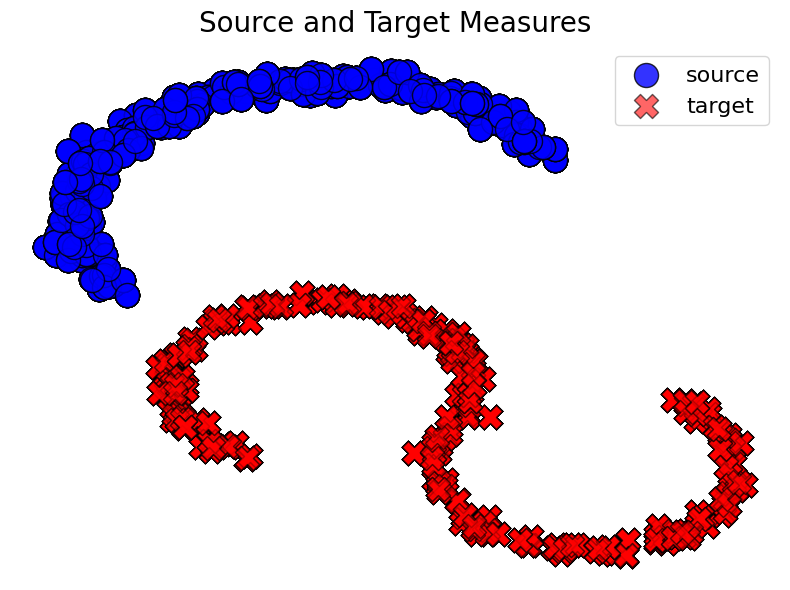

In [20]:
train_dataset, valid_dataset, dim_data = create_samplers(
    source_kwargs={
        "name": "moon",
        "theta_rotation": jnp.pi / 6,
        "mean": jnp.array([0.0, -0.5]),
        "noise": 0.05,
    },
    target_kwargs={
        "name": "s_curve",
        "scale": 0.6,
        "mean": jnp.array([0.5, -2.0]),
        "theta_rotation": -jnp.pi / 6,
        "noise": 0.05,
    },
)

batch = {}
batch["source"] = next(train_dataset.source_iter)
batch["target"] = next(train_dataset.target_iter)
plot_samples(batch=batch, num_points=5_000)

In [21]:
def fit_map(
    cost_fn,
    relative_epsilon_fitting=1e-1,
    relative_epsilon_regularizer=1e-2,
    regularizer_strength=1.0,
    num_train_iters=20_000,
):
    dim_data = 2
    # define the neural map
    model = models.MLP(
        dim_hidden=[64, 64, 64], is_potential=False, act_fn=jax.nn.gelu
    )

    # define the optimizer to learn the neural map
    lr = 1e-3
    optimizer = optax.adam(learning_rate=lr)

    # Compute an order of magnitude for epsilon fitting
    y = next(train_dataset.target_iter)
    epsilon_fitting_scale = pointcloud.PointCloud(y).mean_cost_matrix
    epsilon_fitting = relative_epsilon_fitting * epsilon_fitting_scale
    print("Selected `epsilon_fitting`:", epsilon_fitting)

    @jax.jit
    def fitting_loss(x, y):
        out = sinkhorn_divergence.sinkhorn_divergence(
            pointcloud.PointCloud, x, y, epsilon=epsilon_fitting, static_b=True,cost_fn=costs.Euclidean()
        )
        return out.divergence, out.n_iters

    if cost_fn is None:
        regularizer = None
    else:
        # Compute an order of magnitude for epsilon regularizer
        x = next(train_dataset.source_iter)
        epsilon_regularizer_scale = pointcloud.PointCloud(x, y).mean_cost_matrix
        epsilon_regularizer = (
            relative_epsilon_regularizer * epsilon_regularizer_scale
        )
        print("Selected `epsilon_regularizer`:", epsilon_regularizer)

        def regularizer(x, y):
            gap, out = losses.monge_gap_from_samples(
                x,
                y,
                cost_fn=cost_fn,
                epsilon=epsilon_regularizer,
                return_output=True,
            )
            return gap, out.n_iters

    # define solver
    solver = map_estimator.MapEstimator(
        dim_data=dim_data,
        fitting_loss=fitting_loss,
        regularizer=regularizer,
        model=model,
        optimizer=optimizer,
        regularizer_strength=regularizer_strength,
        num_train_iters=num_train_iters,
        logging=True,
        valid_freq=25,
    )

    return solver.train_map_estimator(
        trainloader_source=train_dataset.source_iter,
        trainloader_target=train_dataset.target_iter,
        validloader_source=valid_dataset.source_iter,
        validloader_target=valid_dataset.target_iter,
    )


def plot_fit_map(title_prefix, neural_state, logs, num_points=80):
    plt.figure(figsize=(9, 3))
    plt.plot(logs["eval"]["total_loss"], label="total loss")
    reg = logs["eval"].get("regularizer")
    if reg[0] > 0.0:
        plt.plot(reg, label="regularizer")
        plt.plot(logs["eval"].get("fitting_loss"), label="fitting loss")

    plt.title("Evaluation error")
    plt.xlabel("Validation iteration")
    plt.legend()
    plt.loglog()

    # plot the fitted map
    batch["mapped_source"] = neural_state.apply_fn(
        {"params": neural_state.params},
        batch["source"][:, :num_points],
    )
    plot_samples(
        batch=batch,
        num_points=num_points,
        title=r"Fitted map $\hat{T}_\theta$, " + title_prefix,
    )
    sink_its = logs["eval"]["log_fitting"]
    print(
        "Avg # of Sinkhorn iterations for fitting loss",
        10
        * jnp.mean(jnp.array([sink_its[i][0] for i in range(len(sink_its))])),
    )
    if reg[0] > 0.0:
        sink_its = logs["eval"]["log_regularizer"]
        print(
            "Avg # of Sinkhorn iterations for regularizer",
            10
            * jnp.mean(jnp.array([sink_its[i] for i in range(len(sink_its))])),
        )

In [22]:
out_nn, logs = fit_map(None)

Selected `epsilon_fitting`: 0.1791148


  6%|▌         | 1204/20000 [00:08<02:14, 139.88it/s, fitting_loss: 0.2999, regularizer: NA ,total: 0.2999]


KeyboardInterrupt: 

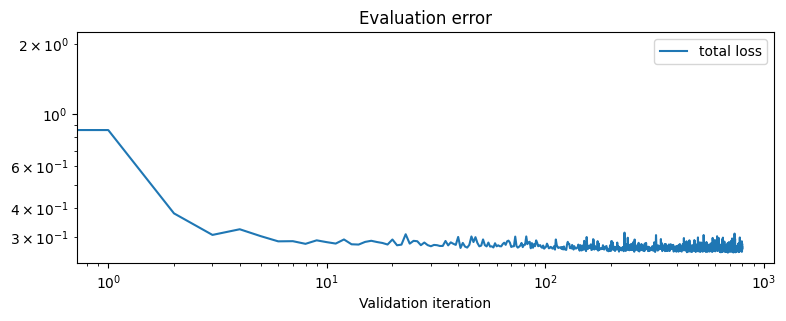

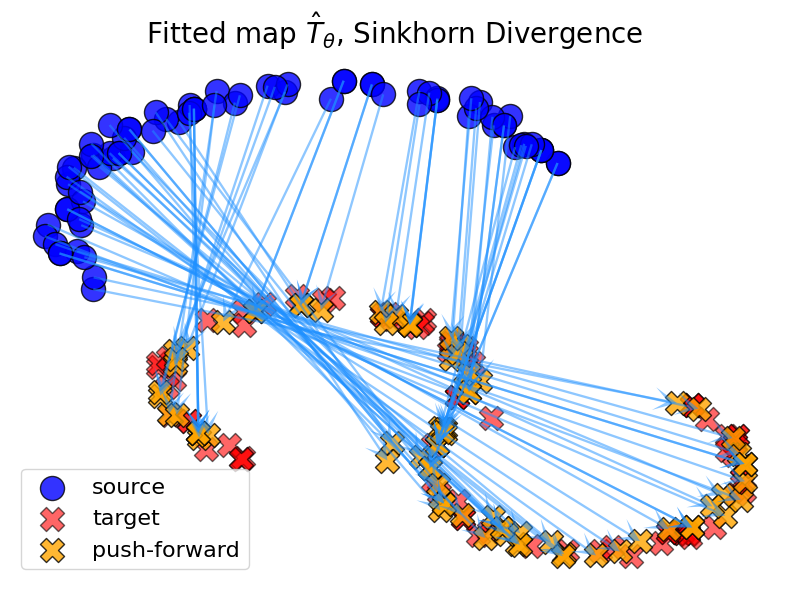

Avg # of Sinkhorn iterations for fitting loss 566.2921


In [12]:
plot_fit_map("Sinkhorn Divergence", out_nn, logs, num_points=80)

In [65]:
out_nn_l22, logs_l22 = fit_map(costs.SqEuclidean(), regularizer_strength=0.1)

Selected `epsilon_fitting`: 0.119959764
Selected `epsilon_regularizer`: 0.06324151


100%|████████████████████████████████████████████████████████████████████████████████████████████| 5000/5000 [01:13<00:00, 67.64it/s, fitting_loss: 0.1103, regularizer: 0.5630 ,total: 0.1666]


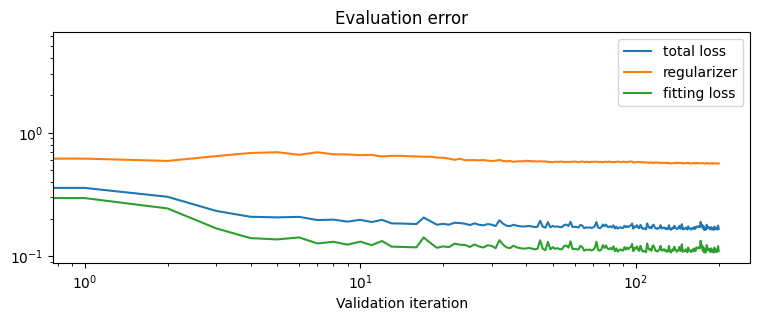

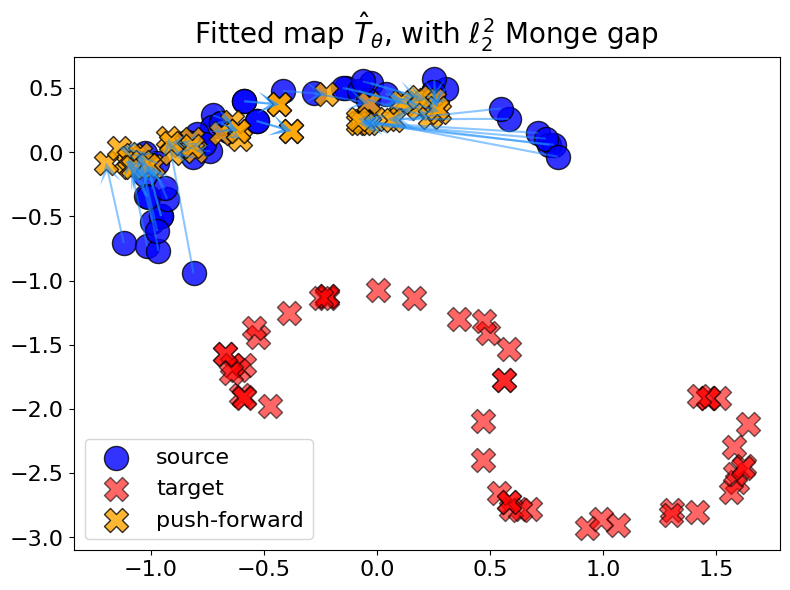

Avg # of Sinkhorn iterations for fitting loss 581.59204
Avg # of Sinkhorn iterations for regularizer 1323.383


In [68]:
plot_fit_map(rf"with $\ell_2^2$ Monge gap", out_nn_l22, logs_l22, num_points=50)

In [13]:
out_nn_l2, logs_l2 = fit_map(costs.Euclidean(), regularizer_strength=2.0)

Selected `epsilon_fitting`: 0.17309546
Selected `epsilon_regularizer`: 0.06390258


100%|██████████| 20000/20000 [02:28<00:00, 135.03it/s, fitting_loss: 0.2629, regularizer: 0.6496 ,total: 1.5622]


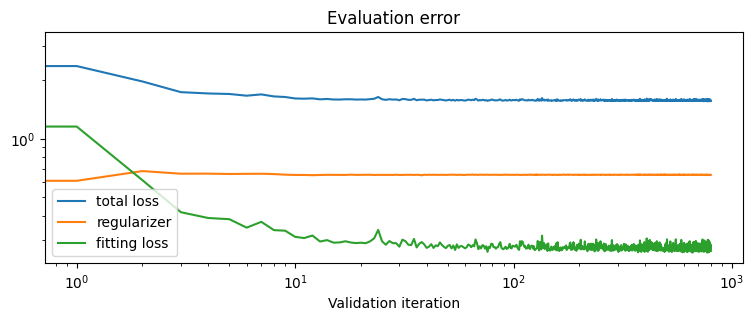

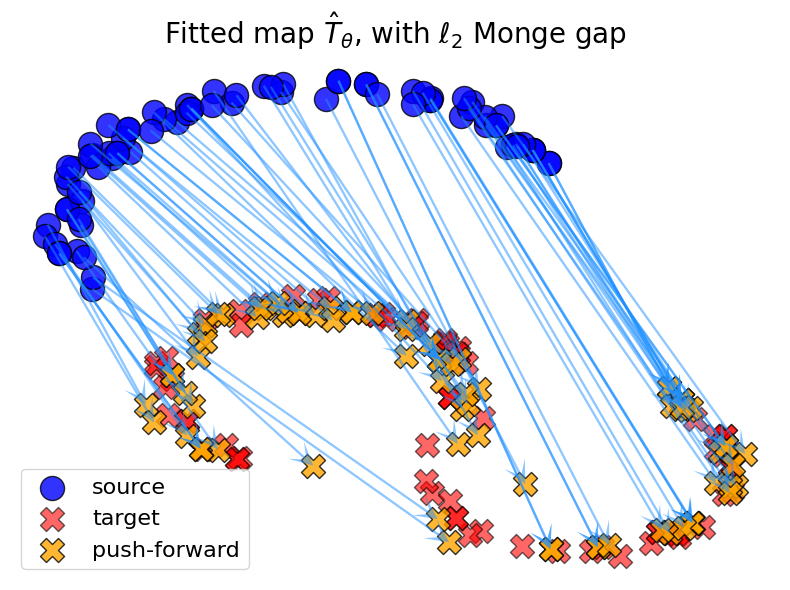

Avg # of Sinkhorn iterations for fitting loss 577.5281
Avg # of Sinkhorn iterations for regularizer 203.49562


In [14]:
plot_fit_map(rf"with $\ell_2$ Monge gap", out_nn_l2, logs_l2, num_points=80)

Training iteration: 20000/20001
Neural dual distance between source and target data: 2.19


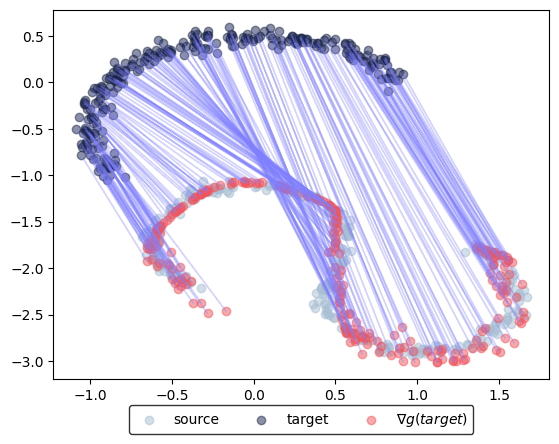

u_diff 4.6789646e-06


In [15]:
from src.anycost_neural import ENOT
from ott.geometry import costs

neural_f = PotentialNN(dim_hidden=[64, 64, 64], act_fn=jax.nn.gelu)
neural_g = PotentialNN(dim_hidden=[64, 64, 64], act_fn=jax.nn.gelu, is_potential=False)

num_train_iters = 20_001

lr_schedule_f = optax.cosine_decay_schedule(
    init_value=3e-4, decay_steps=num_train_iters, alpha=1e-4
)

lr_schedule_g = optax.cosine_decay_schedule(
    init_value=3e-4, decay_steps=num_train_iters, alpha=1e-4
)
optimizer_f = optax.adam(learning_rate=lr_schedule_f, b1=0.9, b2=0.999)
optimizer_g = optax.adam(learning_rate=lr_schedule_g, b1=0.9, b2=0.999)


def training_callback(step, tt, learned_potentials):
    if step % 5_000 == 0:
        clear_output()
        print(f"Training iteration: {step}/{num_train_iters}")

        neural_dual_dist = learned_potentials.distance(sample_data_source, sample_data_target)
        print(
            f"Neural dual distance between source and target data: {neural_dual_dist:.2f}"
        )
        
        fig, ax = learned_potentials.plot_ot_map(
            sample_data_source,
            sample_data_target,
            forward=False,
        )
        display(fig)
        plt.close(fig)
        
neural_dual_solver = ENOT(
    2,
    neural_f,
    neural_g,
    optimizer_f,
    optimizer_g,
    num_train_iters=num_train_iters,
    expectile=0.9,
    expectile_loss_coef=1,
    cost_fn=costs.Euclidean(),
    rng=jax.random.PRNGKey(42),
    is_symmetric=False,
    use_dot_product=False,
)

train_dataset, valid_dataset, dim_data = create_samplers(
    target_kwargs={
        "name": "moon",
        "theta_rotation": jnp.pi / 6,
        "mean": jnp.array([0.0, -0.5]),
        "noise": 0.05,
    },
    source_kwargs={
        "name": "s_curve",
        "scale": 0.6,
        "mean": jnp.array([0.5, -2.0]),
        "theta_rotation": -jnp.pi / 6,
        "noise": 0.05,
    },
)
sample_data_source = next(train_dataset.source_iter)
sample_data_target = next(train_dataset.target_iter)

learned_potentials = neural_dual_solver(
    *train_dataset,
    *valid_dataset,
    callback=training_callback,
)


In [20]:
def plot_samples(
    train_source: Any,
    train_target: Any,
    num_points: Optional[int] = None,
    learned_potentials: Any = None,
    title: Optional[str] = None,
    figsize: Tuple[int, int] = (8, 6),
    rng: Optional[jax.Array] = None,
):
    rng = jax.random.PRNGKey(0) if rng is None else rng
    fig, ax = plt.subplots(figsize=figsize)
    subsample_source = jax.random.choice(
        rng, a=len(train_source), shape=(num_points, )
    )
    subsample_target = jax.random.choice(
        rng, a=len(train_target), shape=(num_points, )
    )
    ax.scatter(
        train_source[subsample_source, 0],
        train_source[subsample_source, 1],
        label="source",
        c="b",
        edgecolors="k",
        s=300,
        alpha=0.8,
    )
    ax.scatter(
        train_target[subsample_target, 0],
        train_target[subsample_target, 1],
        label="target",
        c="r",
        edgecolors="k",
        marker="X",
        s=300,
        alpha=0.6,
    )
    mapped_source = learned_potentials.transport(train_source[subsample_source], forward=False)
    ax.scatter(
        mapped_source[:, 0],
        mapped_source[:, 1],
        label="push-forward",
        c="orange",
        edgecolors="k",
        marker="X",
        s=300,
        alpha=0.8,
    )
    z = mapped_source - train_source[subsample_source]
    ax.quiver(
        train_source[subsample_source, 0],
        train_source[subsample_source, 1],
        z[:, 0],
        z[:, 1],
        angles="xy",
        scale_units="xy",
        scale=1.0,
        width=0.003,
        headwidth=10,
        headlength=10,
        color="dodgerblue",
        edgecolor="k",
        alpha=0.5,
    )
    ax.set_title(title, fontsize=20, y=1.01)
    ax.tick_params(axis="both", which="major", labelsize=16)
    ax.legend(fontsize=16, loc="lower left")
    plt.axis('off')
    fig.tight_layout()
    plt.show()

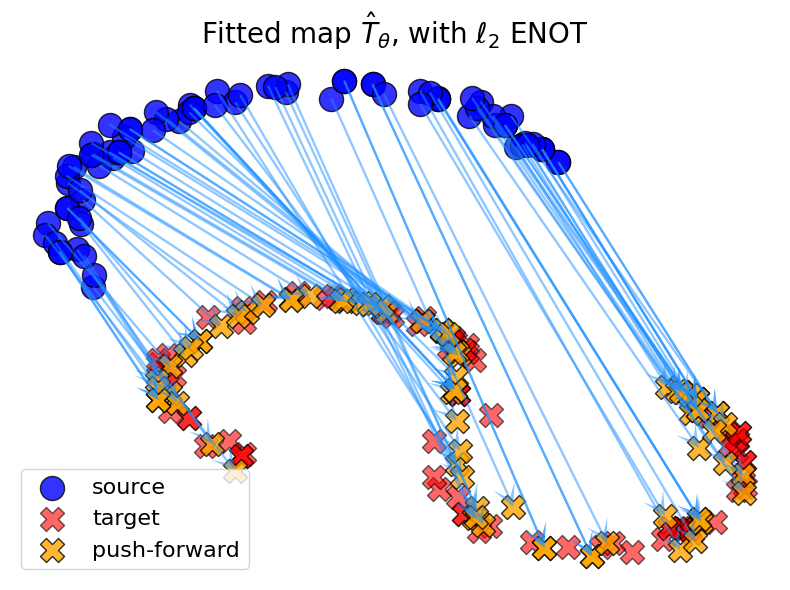

In [26]:
plot_samples(batch['source'], batch['target'], learned_potentials=learned_potentials, 
             title=r"Fitted map $\hat{T}_\theta$, with $\ell_2$ ENOT", num_points=80)

## High-Dim data

In [ ]:
from typing import Iterator, Literal, NamedTuple, Optional, Tuple
import jax.numpy as jnp

class Dataset(NamedTuple):
  r"""Samplers from source and target measures.

  Args:
    source_iter: loader for the source measure
    target_iter: loader for the target measure
  """
  source_iter: Iterator[jnp.ndarray]
  target_iter: Iterator[jnp.ndarray]
  
def get_dataloders():
  train_dataset = Dataset(source_iter=benchmark.source_iterator,
                          target_iter=benchmark.target_iterator)
  valid_dataset = Dataset(source_iter=benchmark.source_iterator,
                          target_iter=benchmark.target_iterator)
  return train_dataset, valid_dataset

train_dataloder, valid_dataloader = get_dataloders()
eval_data_source = next(valid_dataloader.source_iter)
eval_data_target = next(valid_dataloader.target_iter)

In [ ]:
import jax
from sklearn.decomposition import PCA

key = jax.random.PRNGKey(42)
emb_X = PCA(n_components=2).fit_transform(next(valid_dataloader.source_iter))
emb_Y = PCA(n_components=2).fit_transform(next(valid_dataloader.target_iter))

In [ ]:
import matplotlib.pyplot as plt
plt.style.use('bmh')

def plot_measure_samples():
    fig, axs = plt.subplots(1, 2, figsize=(10, 5), gridspec_kw={"wspace": 0.02, "hspace": 0},
                           sharey=True, sharex=True)
    axs[0].scatter(emb_X[:, 0], emb_X[:, 1], color='blue', s=5, alpha=1, edgecolors='black')
    axs[1].scatter(emb_Y[:, 0], emb_Y[:, 1], color='#90EE90', s=5, alpha=1, edgecolors='black')
    axs[0].set_title(r'Source measure $\mathbb{P}$', fontsize=12)
    axs[1].set_title(r'Target measure $\mathbb{Q}$', fontsize=12)
    
    for ax in axs:
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlim(benchmark.bounds[0], benchmark.bounds[1])
        ax.set_ylim(benchmark.bounds[0], benchmark.bounds[1])
    #fig.savefig(fname="inital.png")
    
plot_measure_samples()

In [ ]:
from src.w2_neural import W2StarStar
from src.w2_neural import W2StarStarSymmetric
from ott.neural.solvers.neuraldual import W2NeuralDual

train_dataloder, valid_dataloader = get_dataloders()

def ewma(x, span=200):
    return pd.DataFrame({'x': x}).ewm(span=span).mean().values[:, 0]

W2_history = []
metrics = dict(UVP_fwd=[], UVP_inv=[], cos_fwd=[], cos_inv=[])
baselines = {
    baseline: metrics_to_dict(*score_baseline_maps(benchmark.benchmark, baseline))
                              for baseline in ['identity', 'constant', 'linear']
}

def training_callback(step, learned_potentials):
    if step % 1000 == 0:
        distance = learned_potentials.distance(eval_data_source, eval_data_target) / 2
        W2_history.append(distance)
        
        uvp_metrics = benchmark.eval_extra(learned_potentials)
        metrics['UVP_fwd'].append(uvp_metrics['UVP_fwd'])
        metrics['UVP_inv'].append(uvp_metrics['UVP_inv'])
        metrics['cos_fwd'].append(uvp_metrics['cos_fwd'])
        metrics['cos_inv'].append(uvp_metrics['cos_inv'])
        
        clear_output(wait=True)
        print(f"Training iteration: {step}/{num_train_iters}")
        print("w2 dist", distance)
        print('UVP_fwd', uvp_metrics['UVP_fwd'])
        print('UVP_inv', uvp_metrics['UVP_inv'])
        
         # if benchmark.input_dim > 2:
        #     plot_eval_data_source = emb_X.transform(eval_data_source)
        #     plot_eval_data_target = emb_Y.transform(eval_data_target)
        # else:
        # TODO: Maybe add PCA in ott plot_ot_map?
        # plot_eval_data_source = eval_data_source
        # plot_eval_data_target = eval_data_target
        # fig, ax = learned_potentials.plot_ot_map(
        #     plot_eval_data_source,
        #     plot_eval_data_target,
        #     forward=True
        # )
        # display(fig)
        # plt.close(fig)
        
        # fig, ax = learned_potentials.plot_ot_map(
        #         plot_eval_data_source,
        #         plot_eval_data_target,
        #         forward=False
        #     )
        # display(fig)
        # plt.close(fig)
        
        fig, ax = plt.subplots(1, 1, figsize=(12, 3))
        ax.set_title("Wasserstein-2")
        ax.plot(W2_history, c='blue', label='Estimated cost')
        if hasattr(benchmark.benchmark, 'cost'):
            ax.axhline(benchmark.benchmark.cost, c='green', label='True Cost')
        ax.legend(loc='lower right')
        fig.tight_layout()
        display(fig)
        plt.close(fig)
        
        fig, axes = plot_benchmark_metrics(benchmark.benchmark, metrics, baselines)
        display(fig)
        plt.close(fig)
        
num_train_iters = 60_000
neural_f = models.MLP(
    dim_hidden=[768, 768, 768],
    act_fn=jax.nn.elu,
    is_potential=True
)
neural_g = models.MLP(
    dim_hidden=[768, 768, 768],
    act_fn=jax.nn.elu,
    is_potential=True
)
lr_schedule_f = optax.cosine_decay_schedule(
    init_value=3e-4, decay_steps=num_train_iters, alpha=1e-4
)

lr_schedule_g = optax.cosine_decay_schedule(
    init_value=3e-4, decay_steps=num_train_iters, alpha=1e-4
)
optimizer_f = optax.adam(learning_rate=lr_schedule_f, b1=0.5, b2=0.5)
optimizer_g = optax.adam(learning_rate=lr_schedule_g, b1=0.5, b2=0.5)

neural_dual_solver = W2NeuralDual(
    benchmark.input_dim,
    neural_f,
    neural_g,
    optimizer_f,
    optimizer_g,
    num_train_iters=100_000,
    # valid_freq=3000,
    # log_freq=3000,
)
learned_potentials = neural_dual_solver(*train_dataloder, *valid_dataloader,
                                        callback=training_callback)

## CelebA

In [ ]:
import hydra
from hydra import initialize, compose
from omegaconf import OmegaConf

%matplotlib inline
%load_ext autoreload
%autoreload 2

with initialize(version_base='1.4', config_path="../configs"):
    cfg = compose(config_name='entry.yaml', overrides=['benchmark=celeba', 'benchmark.batch_size=128'])
    
    benchmark = hydra.utils.instantiate(cfg.benchmark)
    print(OmegaConf.to_yaml(cfg))

In [ ]:
def get_dataloders():
  train_dataset = Dataset(source_iter=benchmark.source_iterator,
                          target_iter=benchmark.target_iterator)
  valid_dataset = Dataset(source_iter=benchmark.source_iterator,
                          target_iter=benchmark.target_iterator)
  return train_dataset, valid_dataset

train_dataloder, valid_dataloader = get_dataloders()
eval_data_source = next(valid_dataloader.source_iter)
eval_data_target = next(valid_dataloader.target_iter)

In [ ]:
import matplotlib.pyplot as plt
mean = jnp.array([0.485, 0.456, 0.406])
std = jnp.array([0.229, 0.224, 0.225])

fig, ax = plt.subplots(1, 2)

def to_img(x):
    x = x.reshape(-1, 3, 64, 64).transpose(0, 2, 3, 1)
    x = (x + 1.)/2.
    x = x.clip(0., 1.)
    return x

ax[0].imshow(to_img(eval_data_source[0])[0])
ax[1].imshow(to_img(eval_data_target[0])[0])

In [ ]:
import sys
sys.path.append("..")

from src.w2_neural import W2StarStarInv
from src.models import ConvPotential
from w2benchmark.plotters import plot_benchmark_images
from ott.neural.solvers.neuraldual import W2NeuralDual

W2_history = []
metrics = dict(UVP_fwd=[], UVP_inv=[], cos_fwd=[], cos_inv=[])
baselines = {
    baseline: metrics_to_dict(*score_baseline_maps(benchmark.benchmark, baseline))
                              for baseline in ['identity', 'constant']
}

def training_callback(step, learned_potentials):
    if step % 1000 == 0:
        distance = learned_potentials.distance(eval_data_source, eval_data_target) / 2
        W2_history.append(distance)
        
        uvp_metrics = benchmark.eval_extra(learned_potentials, size=4096, batch_size=benchmark.batch_size)
        metrics['UVP_fwd'].append(uvp_metrics['UVP_fwd'])
        metrics['UVP_inv'].append(uvp_metrics['UVP_inv'])
        metrics['cos_fwd'].append(uvp_metrics['cos_fwd'])
        metrics['cos_inv'].append(uvp_metrics['cos_inv'])
        
        clear_output(wait=True)
        print(f"Training iteration: {step}/{num_train_iters}")
        print("w2 dist", distance)
        print('UVP_fwd', uvp_metrics['UVP_fwd'])
        print('UVP_inv', uvp_metrics['UVP_inv'])

        fig, axes = plot_benchmark_images(benchmark.benchmark,learned_potentials)
        display(fig)
        plt.close(fig)

        fig, ax = plt.subplots(1, 1, figsize=(12, 3))
        ax.set_title("Wasserstein-2")
        ax.plot(W2_history, c='blue', label='Estimated cost')
        if hasattr(benchmark.benchmark, 'cost'):
            ax.axhline(benchmark.benchmark.cost, c='green', label='True Cost')
        ax.legend(loc='lower right')
        fig.tight_layout()
        display(fig)
        plt.close(fig)
        
        fig, axes = plot_benchmark_metrics(benchmark.benchmark, metrics, baselines)
        display(fig)
        plt.close(fig)
        
num_train_iters = 100_000
neural_f = ConvPotential(
    act_fn=jax.nn.elu,
    is_potential=True
)
neural_g = ConvPotential(
    act_fn=jax.nn.elu,
    is_potential=True
)
lr_schedule_f = optax.cosine_decay_schedule(
    init_value=2e-4, decay_steps=num_train_iters, alpha=1e-4
)

lr_schedule_g = optax.cosine_decay_schedule(
    init_value=3e-4, decay_steps=num_train_iters, alpha=1e-4
)
optimizer_f = optax.adam(learning_rate=lr_schedule_f, b1=0.5, b2=0.5)
optimizer_g = optax.adam(learning_rate=lr_schedule_g, b1=0.5, b2=0.5)

neural_dual_solver = W2StarStarInv(
    benchmark.input_dim,
    neural_f,
    neural_g,
    optimizer_f,
    optimizer_g,
    num_train_iters=num_train_iters,
    expectile=0.99,
)
learned_potentials = neural_dual_solver(*train_dataloder, *valid_dataloader,
                                        callback=training_callback)